In [22]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('../')
sys.path.append('../hovernet')
sys.path.append('../deconvplugin')

import json
import os
import pickle
import torch
import scanpy as sc

PATH = '/home/luca/Documents/data/'

#'/cluster/CBIO/data1/lgortana/'
#'/home/luca/Documents/data/'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Load data

In [23]:
# names
adata_name = 'Xenium_V1_humanLung_Cancer_FFPE'
atlas_name = 'LuCA'
sim_tag = 'real'
model_tag = 'model_quick_alpha_0.0_lr_0.0003_weights_False_divergence_l2_seed_42'

In [24]:
import pandas as pd

data_path = os.path.join(PATH, adata_name)
sim_path = os.path.join(data_path, "sim", atlas_name)

#load images
image_path = os.path.join(data_path, 'tif', 'Xenium_V1_humanLung_Cancer_FFPE_he_image.ome.tif')
image_dict = torch.load(os.path.join(sim_path, 'image_dict_64.pt'))

#load ground truth
ground_truth = pd.read_csv(os.path.join(sim_path, f'sim_{adata_name}_gt.csv'), index_col=0)
ground_truth.index = ground_truth.index.astype(str)

In [68]:
#load adata
path_ST_adata = os.path.join(sim_path, f"pseudo_adata_{sim_tag}.h5ad")
adata = sc.read_h5ad(path_ST_adata)

#load proportions
spot_prop_df = pd.read_csv(os.path.join(sim_path, f'sim_{adata_name}_prop_{sim_tag}.csv'), index_col=0)
spot_prop_df.index = spot_prop_df.index.astype(str)
ct_list = list(spot_prop_df.columns)

#load segmentation
json_path = os.path.join(sim_path, "pannuke_fast_mask_lvl3_annotated.json")
with open(json_path) as json_file:
    hovernet_dict = json.load(json_file)

#color_dict annotated hovernet
from deconvplugin.basics import generate_color_dict
dict_types_colors = generate_color_dict(ct_list, format='special')
dict_types_colors[f'{len(ct_list)}'] = ['low_counts', [0, 0, 0, 255]]
dict_types_colors[f'{len(ct_list)+1}'] = ['no_match', [170, 170, 170, 255]]

# Annotated Xenium data (ground truth)

In [69]:
from deconvplugin.analysis.postseg import StdVisualizer

plotter = StdVisualizer(image_path=image_path,
                        adata=adata,
                        adata_name=adata_name,
                        seg_dict=hovernet_dict,
                        color_dict=dict_types_colors)

Visium data found.


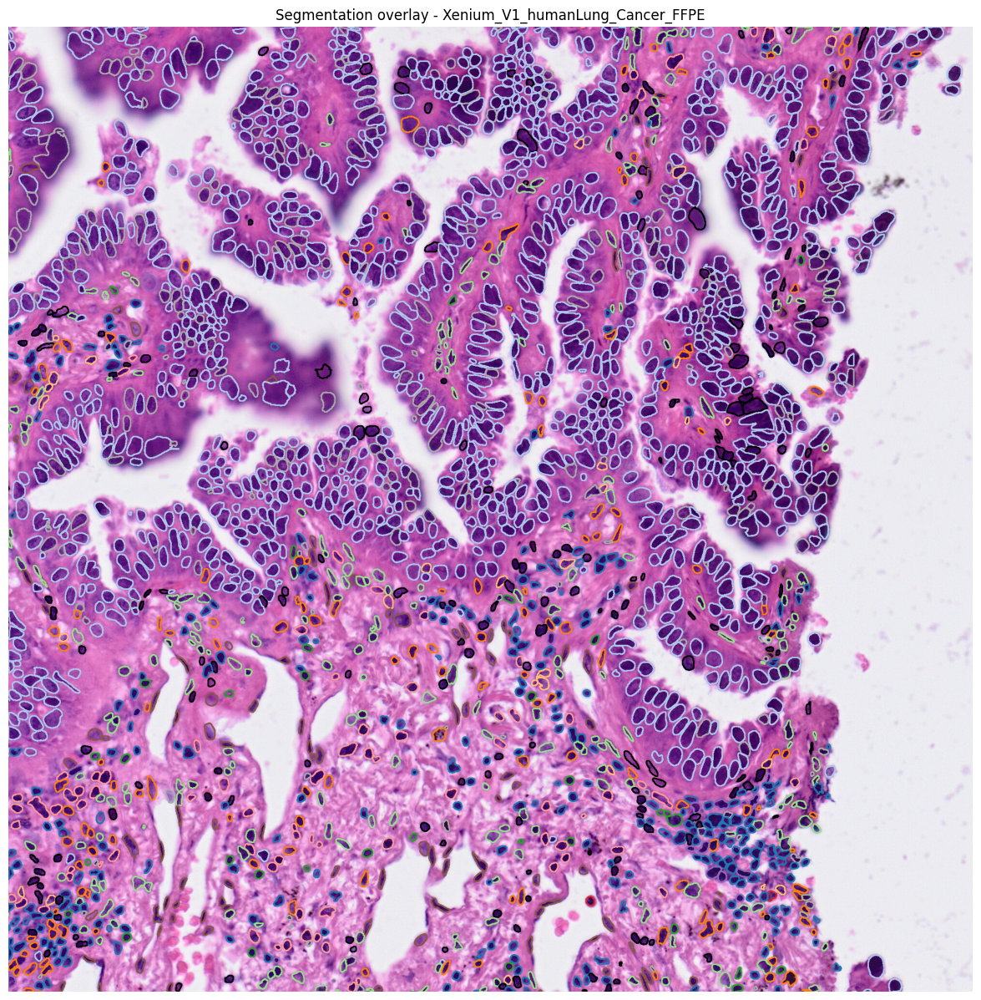

In [70]:
window = ((6000, 20000), (2000, 2000)) #((3000, 20000), (2000, 2000))
plotter.plot_seg(window=window, show_visium=False, display=True)
# fig.savefig("../../data-simulation-xenium/fig/Xenium_humanLung_Cancer_annotated_LuCA2.png", dpi=300, bbox_inches='tight')

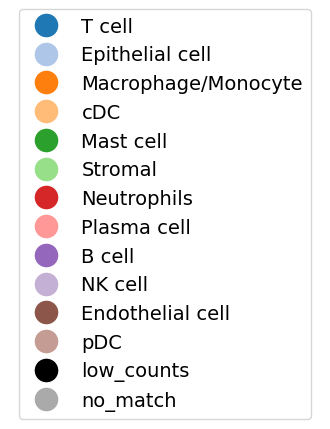

In [71]:
from deconvplugin.analysis.plots import plot_legend

plot_legend(dict_types_colors)

# Model predictions

In [25]:
#load model infos
model_dir = os.path.join('../models/quick-semi-sim-emb-v2-2', sim_tag, model_tag)

with open(os.path.join(model_dir, 'info.pickle'), 'rb') as f:
    model_info = pickle.load(f)

In [26]:
from deconvplugin.analysis.pred_analyzer import PredAnalyzer

analyzer = PredAnalyzer(model_info=model_info,
                        adjusted=True,
                        ground_truth=ground_truth, 
                        image_dict=image_dict
                        )

Loading predicted labels...
Loading true labels...
Use `add_attributes(seg_dict=your_seg_dict)` to add one.


In [89]:
pd.DataFrame(analyzer.proportions.mean(axis=0)).T

,T cell,Epithelial cell,Macrophage/Monocyte,cDC,Mast cell,Stromal,Neutrophils,Plasma cell,B cell,NK cell,Endothelial cell,pDC
0,0.077654,0.598289,0.076439,0.00991,0.010528,0.14946,0.002283,0.01483,0.006139,0.000898,0.053457,0.000114


In [90]:
analyzer.add_attributes(adata=adata,
                        adata_name=adata_name,
                        image_path=image_path,
                        seg_dict=hovernet_dict)

In [91]:
from deconvplugin.analysis.postseg import StdVisualizer

plotter = StdVisualizer(image_path, 
                        adata, 
                        adata_name, 
                        seg_dict=analyzer.seg_dict_w_class,
                        color_dict=analyzer.color_dict)

Visium data found.


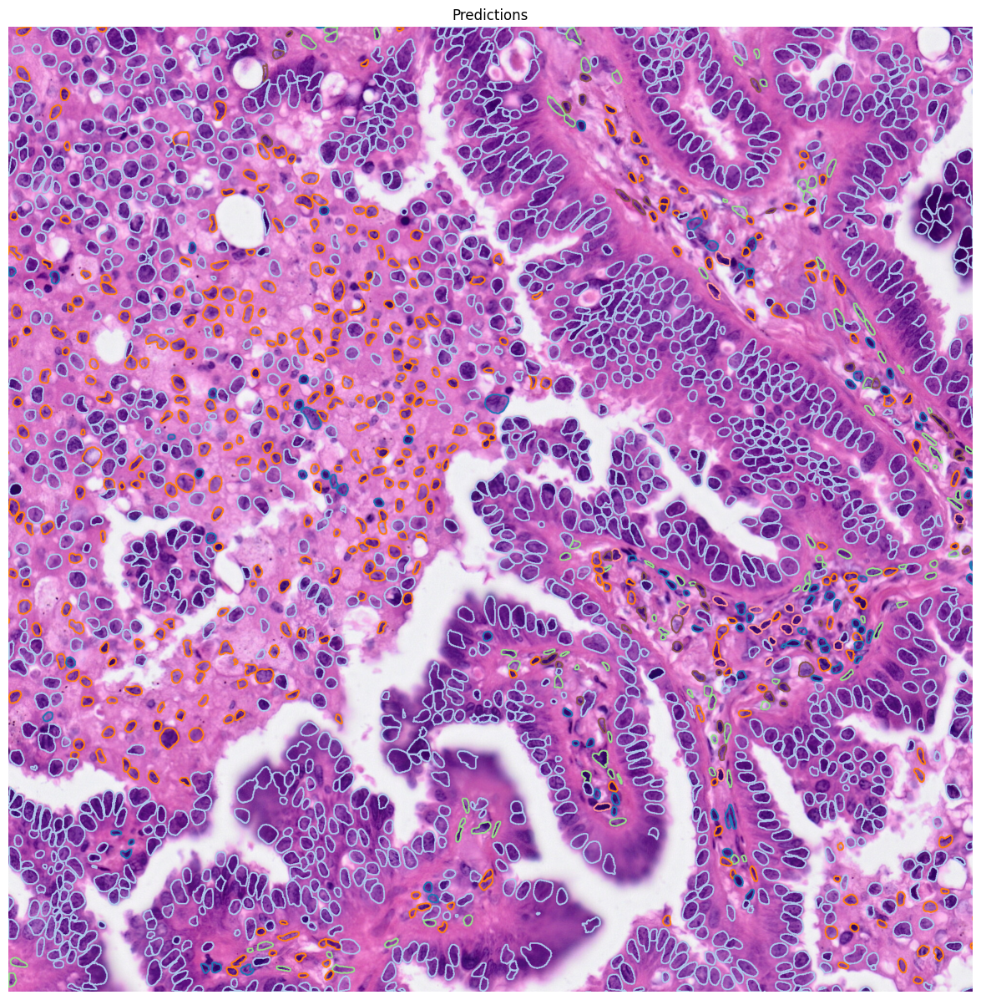

In [92]:
window = ((3000, 20000), (2000, 2000)) #((6000, 20000), (2000, 2000))
plotter.plot_seg(window=window, show_visium=False, display=True, title="Predictions")

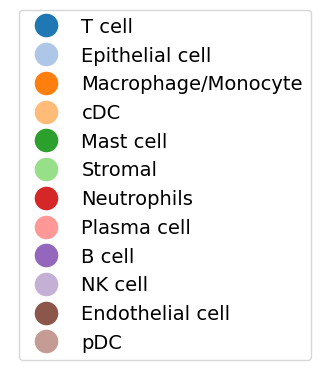

In [93]:
plot_legend(analyzer.color_dict)

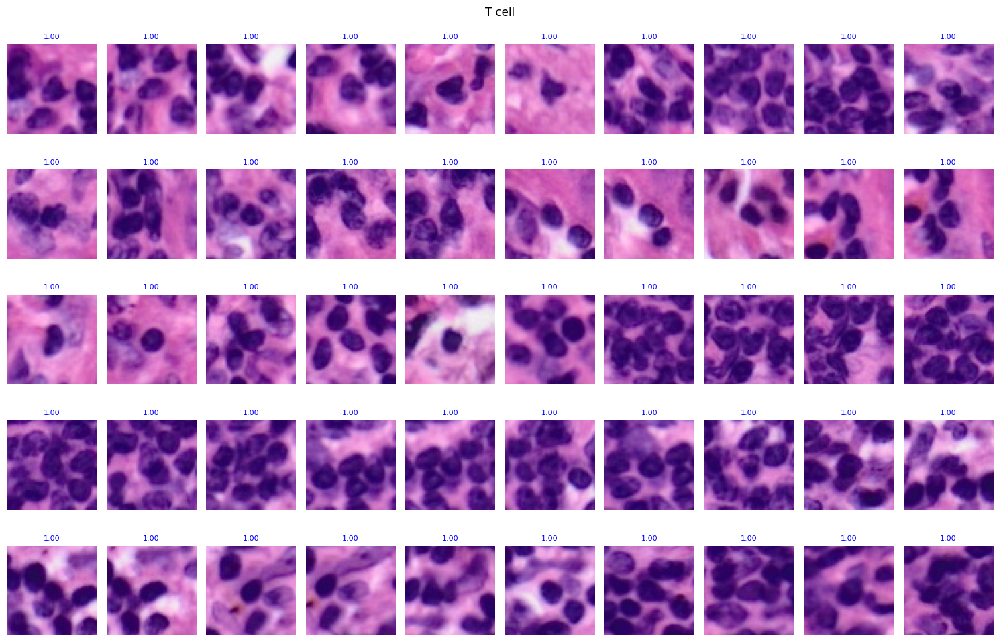

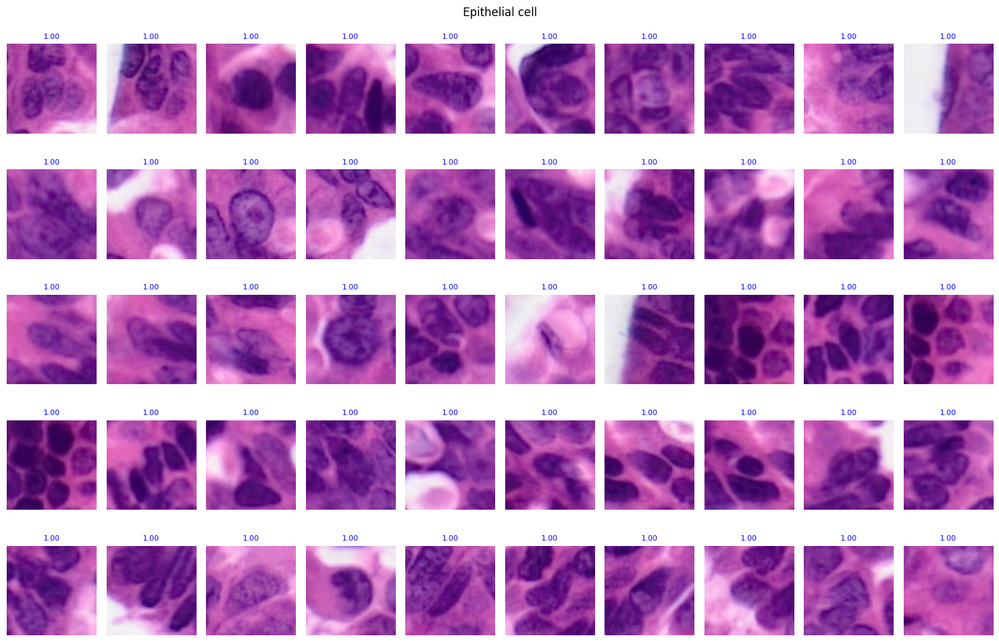

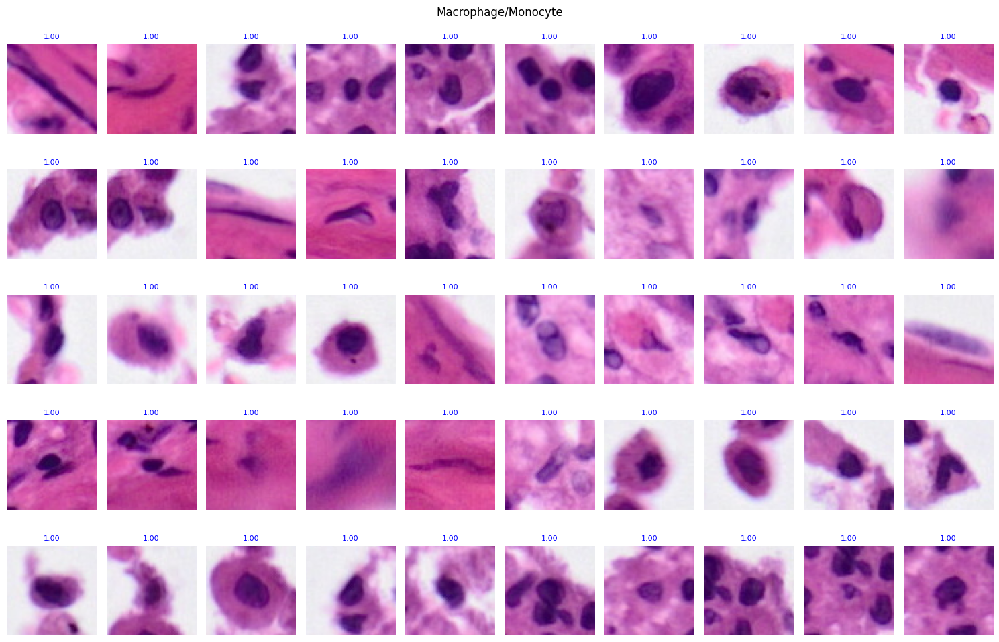

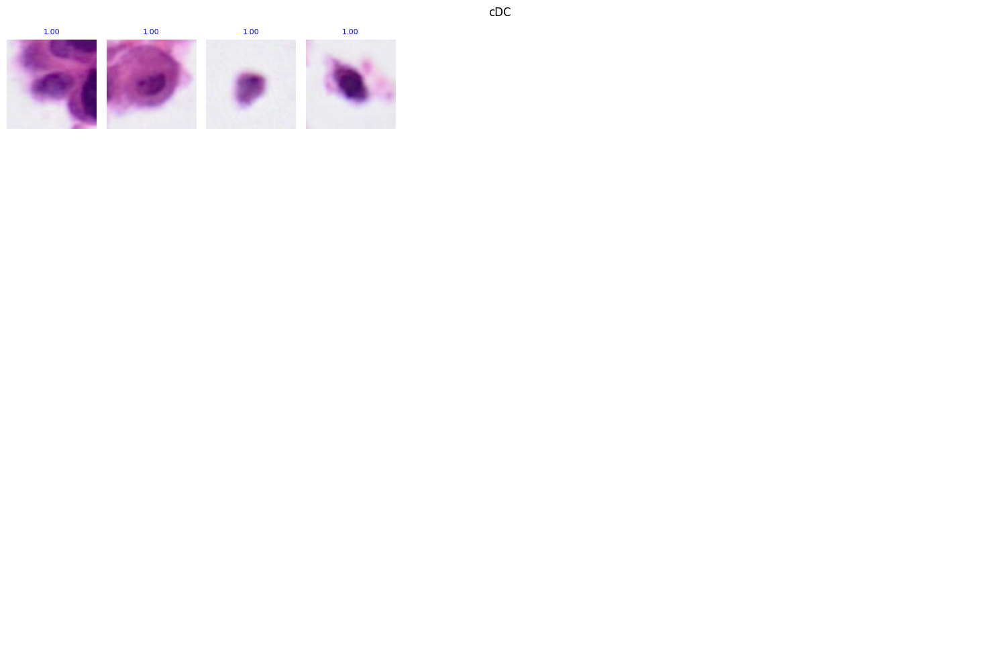

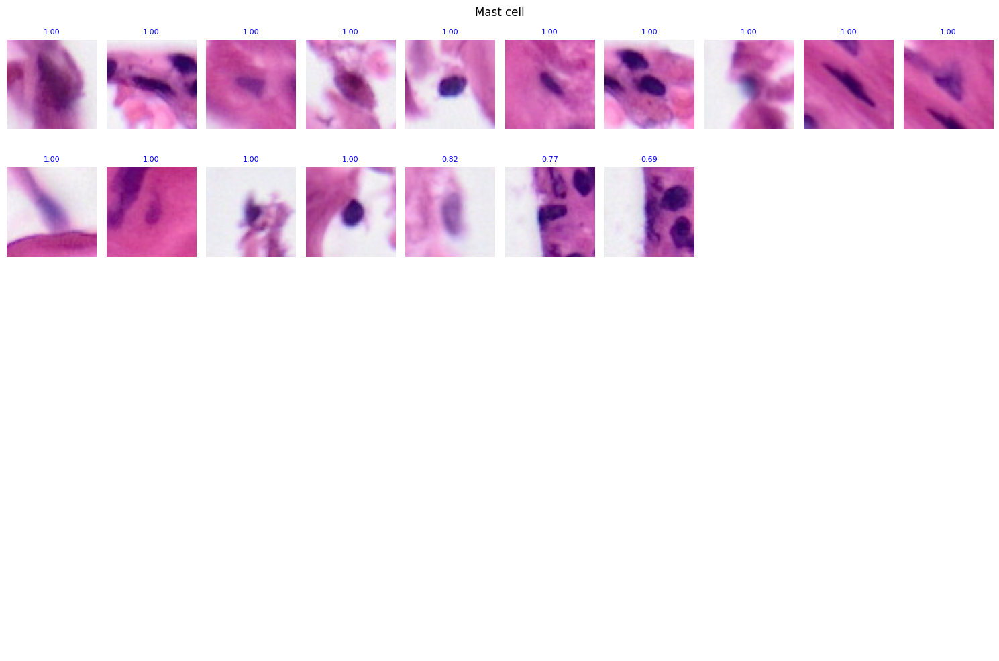

...

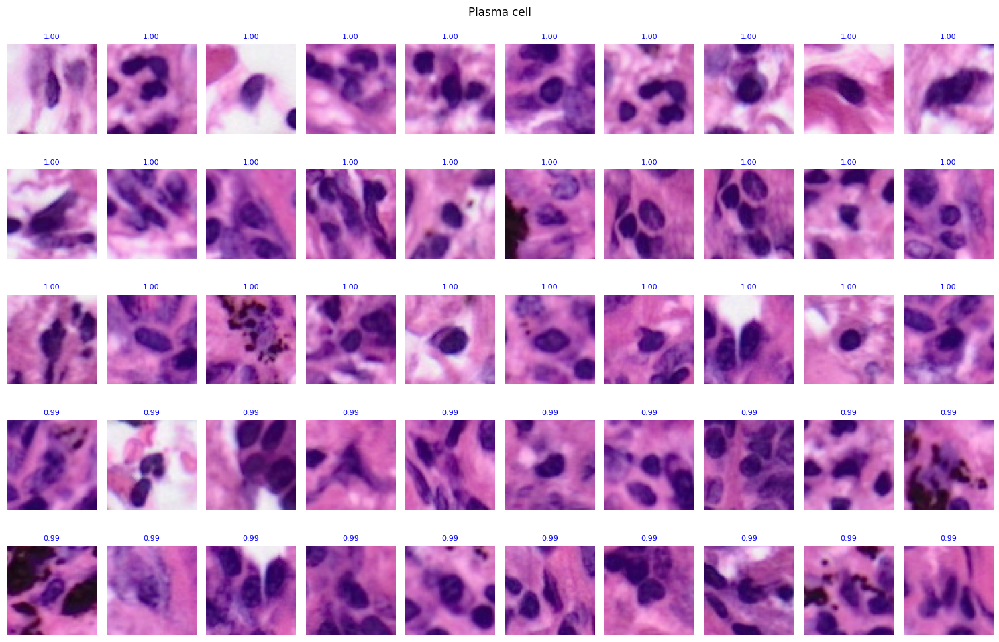

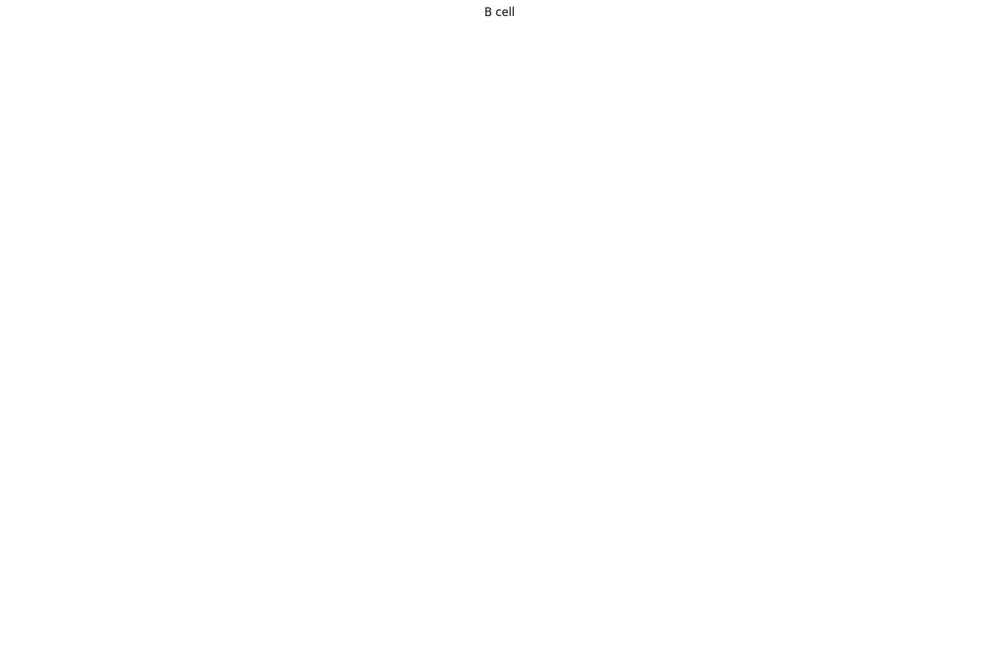

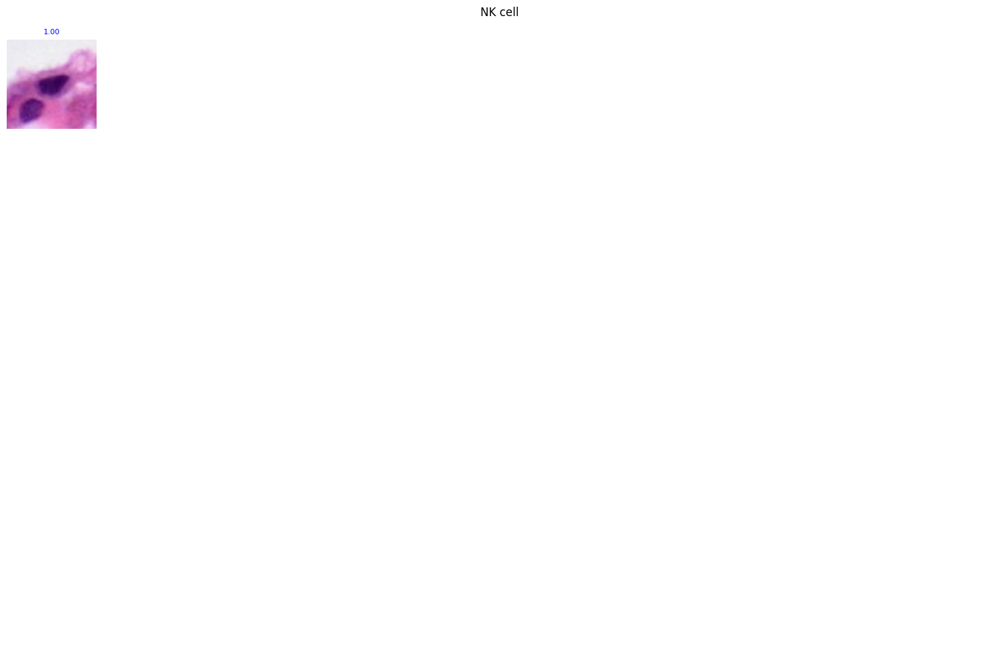

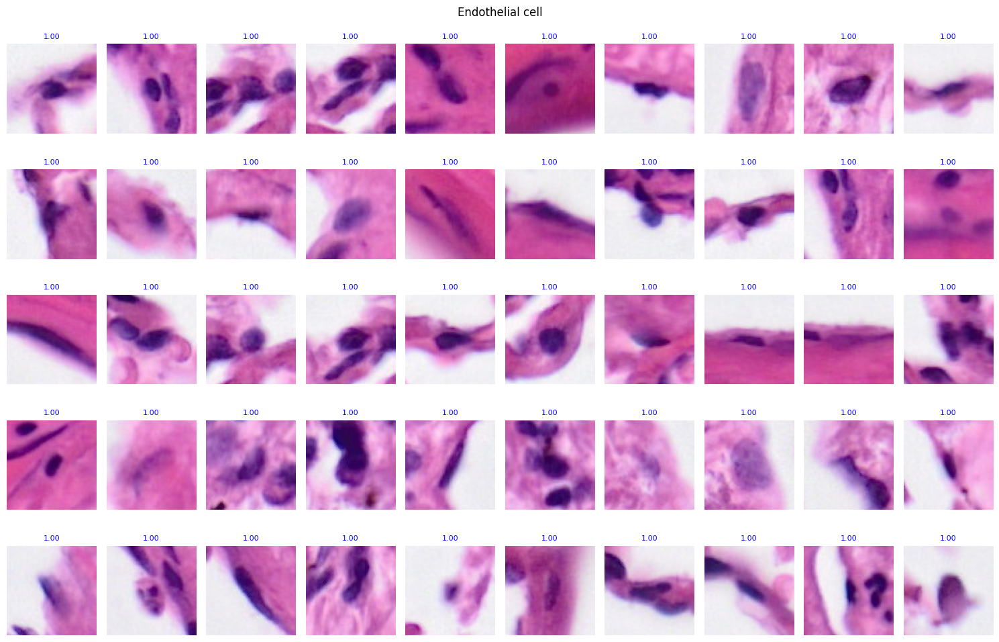

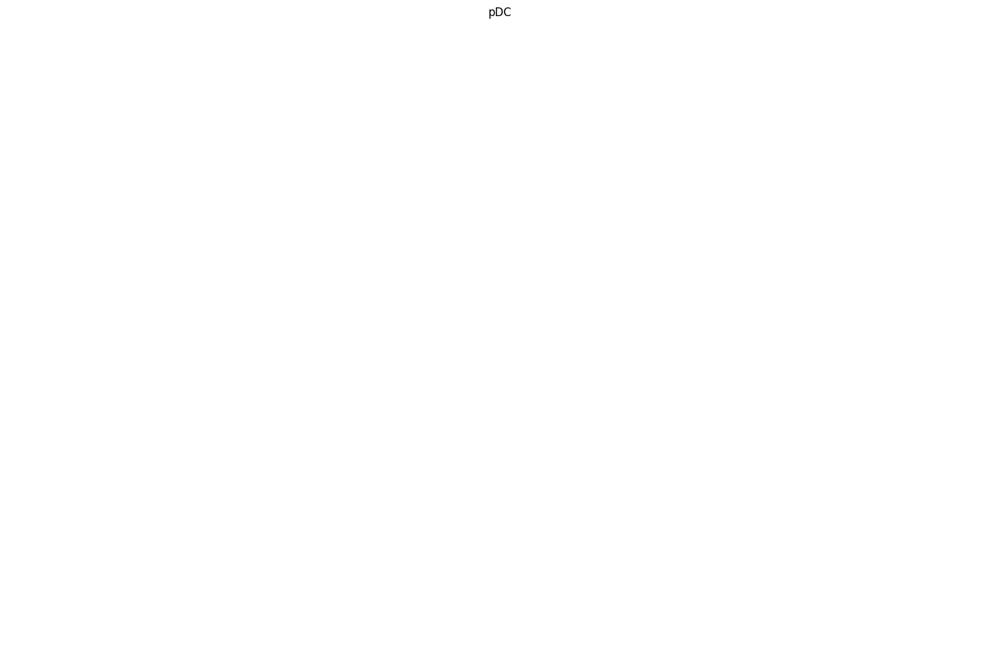

In [94]:
for ct in analyzer.ct_list:
    analyzer.plot_grid_celltype(cell_type=ct, n=50, selection="max", display=True)

Visium data found.


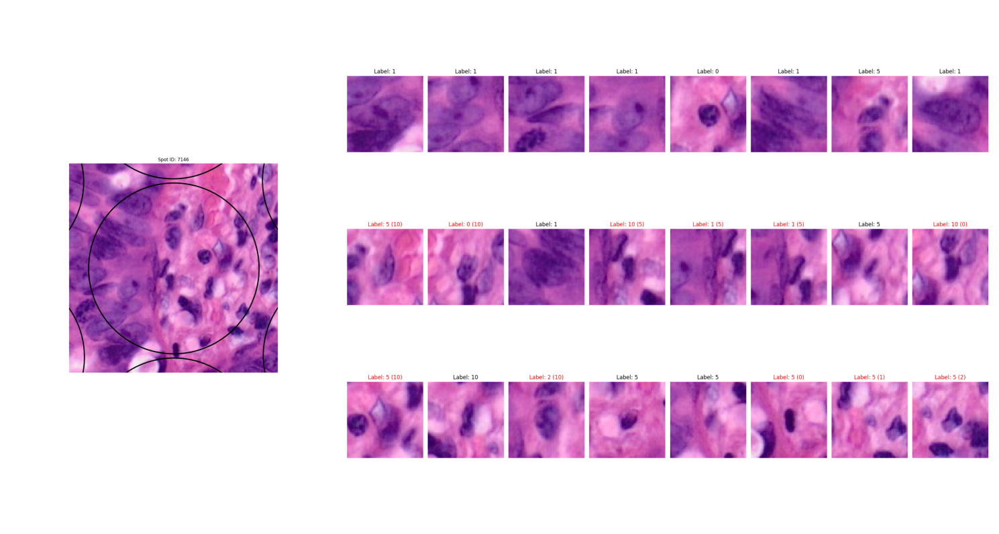

In [95]:
analyzer.plot_predicted_cell_labels_in_spot(spot_id='7146', show_labels=True, display=True)

Visium data found.


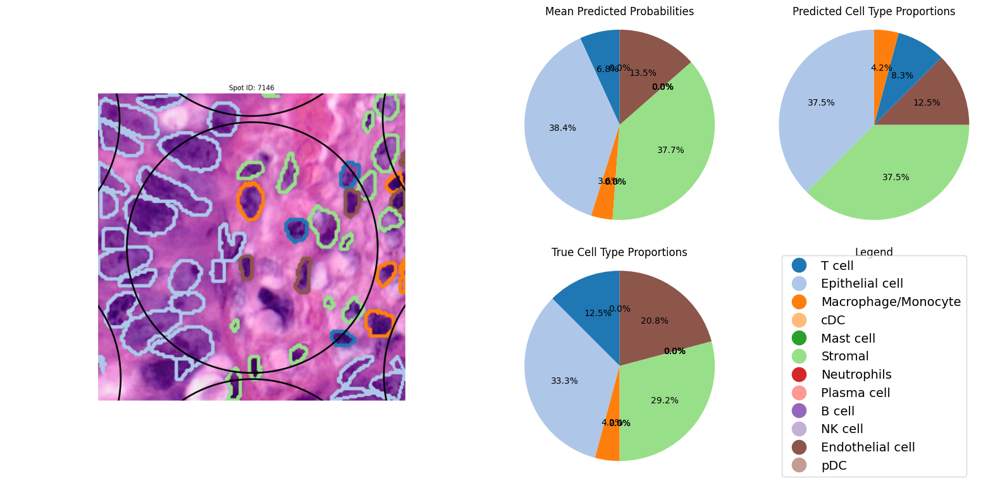

In [96]:
analyzer.plot_spot_proportions(spot_id='7146', draw_seg=True) #"ATTAGACACCAGTCCA-1"

In [97]:
analyzer.evaluate_spot_predictions()

{'Spearman Correlation': 0.9864467782843551,
 'Pearson Correlation': 0.9449022616932196,
 'Weighted MSE': 9.900898013860264e-06,
 'MSE': 0.0037236642384503465,
 'Weighted MAE': 6.022882168781207e-05,
 'MAE': 0.019731561298457368,
 'R^2 Score': 0.4957480725862215,
 'Balanced Accuracy': 0.5437421912381416,
 'Weighted F1 Score': 0.8785358408280651,
 'Weighted Precision': 0.8794927970462298,
 'Weighted Recall': 0.8801945181255526}

In [29]:
perf = analyzer.evaluate_cell_predictions(subset="no_train", per_class=False)
perf

{'Global Accuracy': 0.7980909143821664,
 'Balanced Accuracy': 0.6040535266885824,
 'Weighted F1 Score': 0.7951858059623469,
 'Weighted Precision': 0.7956732886304145,
 'Weighted Recall': 0.7980909143821664}

In [99]:
perf["Confusion Matrix"]

,B cell,Endothelial cell,Epithelial cell,Macrophage/Monocyte,Mast cell,NK cell,Neutrophils,Plasma cell,Stromal,T cell,cDC,pDC
B cell,0,35,55,64,0,0,0,23,61,1327,0,0
Endothelial cell,0,1053,733,555,0,0,0,39,1659,420,0,0
Epithelial cell,0,384,64671,831,0,0,0,49,1081,541,1,0
Macrophage/Monocyte,0,334,2402,1972,2,0,0,135,1574,1345,1,0
Mast cell,0,87,116,175,9,0,0,28,201,409,0,0
NK cell,0,8,11,5,1,1,0,2,11,8,0,0
Neutrophils,0,28,34,29,0,0,0,2,36,20,0,0
Plasma cell,0,122,256,321,0,0,0,321,281,590,0,0
Stromal,0,925,2511,1727,5,0,0,205,6209,1781,0,0
T cell,0,620,991,1160,0,0,0,224,1590,6251,0,0


# Gridsearch

/tmp/ipykernel_493529/1720528112.py:70: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_493529/1720528112.py:70: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_493529/1720528112.py:70: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


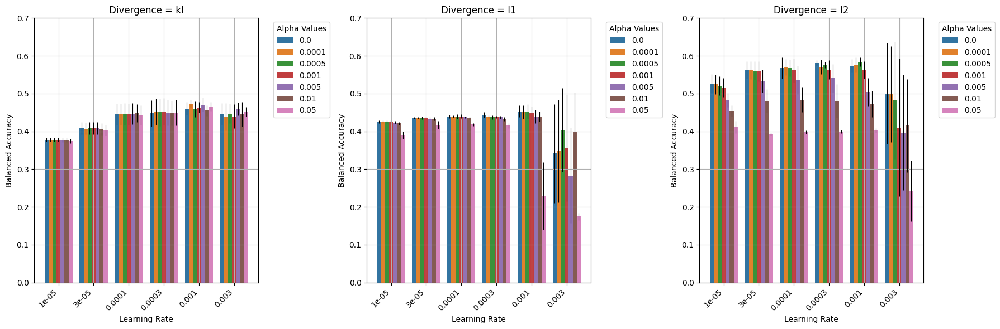

In [59]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import glob
import re

sim = "quick-semi-sim-emb-v2-2"
config = "real"
level = "cells"
subset = "_train" # _train or _no_train
adjusted = True
metric = "Balanced Accuracy" # B cell Endothelial cell Epithelial cell Macrophage/Monocyte Plasma cell Stromal T cell

adj = "_adj" if adjusted else ""
metric_ci = f"{metric} ci"
all_files = glob.glob(f'../models/{sim}/{config}/summary_metrics_{level}_best{adj}{subset}*.csv')
pattern = re.compile(rf"summary_metrics_{level}_best{adj}{subset}(\d*)\.csv$")
files = [f for f in all_files if pattern.search(f)]

if len(files) == 1:
    data = pd.read_csv(files[0])
else:
    data = pd.concat([pd.read_csv(f) for f in files], ignore_index=True)

data['lr'] = data['lr'].astype(float)

# Fill NaN values with 0 for plotting
data[metric] = data[metric].fillna(0)
data[metric_ci] = data[metric_ci].fillna(0)

divergences = ['kl', 'l1', 'l2']

fig, axes = plt.subplots(1, len(divergences), figsize=(18, 6))

for i, divergence in enumerate(divergences):
    ax = axes[i]
    
    divergence_data = data[data['divergence'] == divergence].sort_values(by=['alpha', 'lr'])
    
    sns.barplot(
        x='lr', 
        y=metric, 
        hue='alpha', 
        data=divergence_data, 
        ax=ax, 
        palette='tab10',
        order=sorted(divergence_data['lr'].unique())
    )

    for bar, (lr, alpha) in zip(ax.patches, zip(divergence_data['lr'], divergence_data['alpha'])):
        lr_center = bar.get_x() + bar.get_width() / 2.1
        y_val = bar.get_height()

        subset = divergence_data[(divergence_data['lr'] == lr) & (divergence_data['alpha'] == alpha)]

        if not subset.empty:
            y_err = subset[metric_ci].values[0]
            
            ax.errorbar(
                lr_center, y_val, yerr=y_err, fmt='none', 
                ecolor='black', capsize=3, capthick=0, elinewidth=0.8
            )
    
    ax.set_title(f'Divergence = {divergence}')
    ax.set_xlabel('Learning Rate')
    ax.set_ylabel(metric)
    ax.legend(title='Alpha Values', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.grid(True)

    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_ylim(0, 0.7)

plt.tight_layout()
plt.show()

/tmp/ipykernel_493529/3208965484.py:87: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_493529/3208965484.py:87: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_493529/3208965484.py:87: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


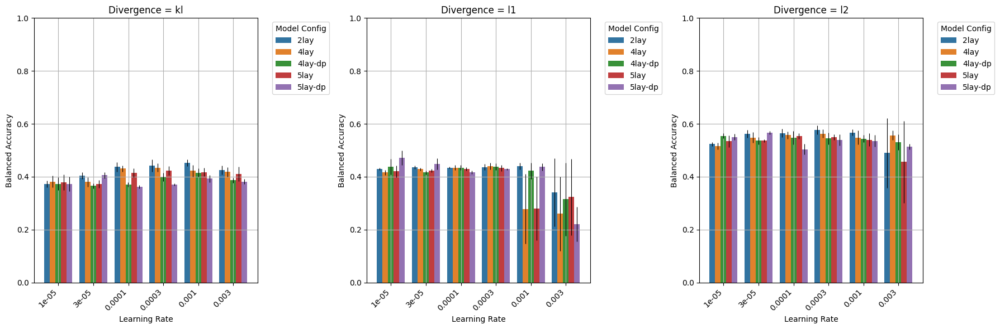

In [68]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import glob
import re

config = "real"
level = "cells"
subset = "_no_train"  # '_no_train' or '_train'
metric = "Balanced Accuracy"
adjusted = True

adj = "_adj" if adjusted else ""
metric_ci = f"{metric} ci"
divergences = ['kl', 'l1', 'l2']

config_folders = {
    '2lay': 'quick-semi-sim-2lay',
    '4lay': 'quick-semi-sim-4lay',
    '4lay-dp': 'quick-semi-sim-4lay-dp',
    '5lay': 'quick-semi-sim-5lay',
    '5lay-dp': 'quick-semi-sim-5lay-dp',
}

all_data = []

for config_label, folder in config_folders.items():
    file_pattern = f'../models/{folder}/{config}/summary_metrics_{level}_best{adj}{subset}*.csv'
    all_files = glob.glob(file_pattern)
    pattern = re.compile(rf"summary_metrics_{level}_best{adj}{re.escape(subset)}(\d*)\.csv$")

    files = [f for f in all_files if pattern.search(f)]

    if not files:
        print(f"No matching files found for config '{config_label}'")
        continue

    if len(files) == 1:
        df = pd.read_csv(files[0])
    else:
        df = pd.concat([pd.read_csv(f) for f in files], ignore_index=True)

    df['lr'] = df['lr'].astype(float)
    df[metric] = df[metric].fillna(0)
    df[metric_ci] = df[metric_ci].fillna(0)
    df['config'] = config_label
    all_data.append(df)

data = pd.concat(all_data, ignore_index=True)
target_lrs = [1e-5, 3e-5, 1e-4, 3e-4, 1e-3, 3e-3]
data = data[(data['alpha'] == 0) & (data['lr'].isin(target_lrs))]

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for i, divergence in enumerate(divergences):
    ax = axes[i]
    div_data = data[data['divergence'] == divergence].sort_values(by=['config', 'lr'])

    sns.barplot(
        x='lr',
        y=metric,
        hue='config',
        data=div_data,
        ax=ax,
        palette='tab10',
        order=sorted(div_data['lr'].unique())
    )

    # Add error bars
    for bar, (lr, config) in zip(ax.patches, zip(div_data['lr'], div_data['config'])):
        lr_center = bar.get_x() + bar.get_width() / 2.1
        y_val = bar.get_height()
        subset_df = div_data[(div_data['lr'] == lr) & (div_data['config'] == config)]

        if not subset_df.empty:
            y_err = subset_df[metric_ci].values[0]
            ax.errorbar(
                lr_center, y_val, yerr=y_err, fmt='none',
                ecolor='black', capsize=3, capthick=0, elinewidth=0.8
            )

    ax.set_title(f'Divergence = {divergence}')
    ax.set_xlabel('Learning Rate')
    ax.set_ylabel(metric)
    ax.legend(title='Model Config', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.grid(True)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_ylim(0, 1)

plt.tight_layout()
plt.show()

# ML Classification analysis

[{'dataset': 'train', 'model': 'logistic', 'balance': 'unbalanced', 'penalty': 'l1', 'C': '0.1', 'balanced_accuracy': 0.47612080179423266, 'ci': 0.0021627059446491753}, {'dataset': 'train', 'model': 'logistic', 'balance': 'balanced', 'penalty': 'l1', 'C': '0.1', 'balanced_accuracy': 0.639218917873335, 'ci': 0.002240696112393464}] [{'dataset': 'test', 'model': 'logistic', 'balance': 'balanced', 'penalty': 'l1', 'C': '0.1', 'balanced_accuracy': 0.5769690873900677, 'ci': 0.004329445208824851}, {'dataset': 'test', 'model': 'logistic', 'balance': 'unbalanced', 'penalty': 'l1', 'C': '0.1', 'balanced_accuracy': 0.46655602898256765, 'ci': 0.004864430825035033}]
[{'dataset': 'train', 'model': 'logistic', 'balance': 'balanced', 'penalty': 'l1', 'C': '1.0', 'balanced_accuracy': 0.7075037647195522, 'ci': 0.002052863074524185}, {'dataset': 'train', 'model': 'logistic', 'balance': 'unbalanced', 'penalty': 'l1', 'C': '1.0', 'balanced_accuracy': 0.549335752861812, 'ci': 0.002166392288592379}] [{'datas

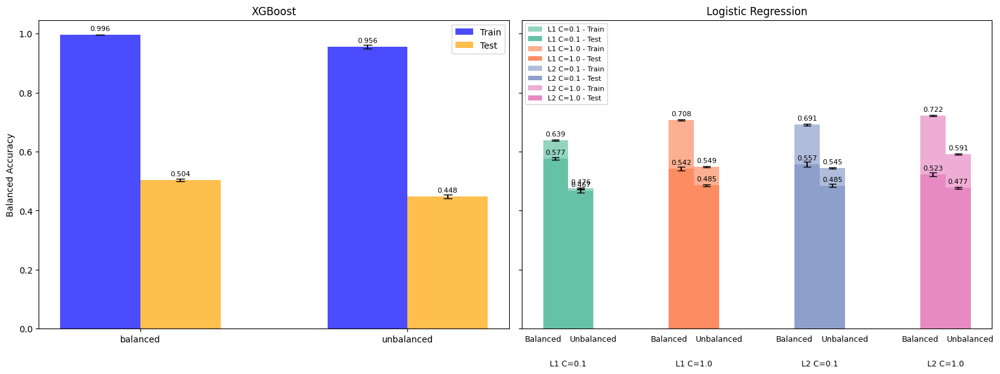

In [ ]:
import json
import os
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

metric = "Balanced Accuracy"
folder_path = "/home/luca/Documents/data/Xenium_V1_humanLung_Cancer_FFPE/sim/LuCA/classif/metrics"

# Collect all JSON file names
all_files = os.listdir(folder_path)

# Filter files related to logistic regression and xgboost
logistic_files = [f for f in all_files if "logistic" in f]
xgboost_files = [f for f in all_files if "xgboost" in f]

data = []

# Helper to parse files
for file in logistic_files + xgboost_files:
    with open(os.path.join(folder_path, file), 'r') as f:
        metrics = json.load(f)

        parts = file.split("_")
        dataset_type = parts[1]  # 'train' or 'test'
        model = parts[2]
        balance = "balanced" if parts[4] == "True" else "unbalanced"
        
        penalty = parts[6] if "penalty" in file else None
        C = parts[8].split(".json")[0] if "penalty" in file else None

        data.append({
            "dataset": dataset_type,
            "model": model,
            "balance": balance,
            "penalty": penalty,
            "C": C,
            "balanced_accuracy": metrics[metric],
            "ci": metrics[f"{metric} ci"]
        })

# Separate xgboost and logistic
xgboost_data = [d for d in data if d["model"] == "xgboost"]
logistic_data = [d for d in data if d["model"] == "logistic"]

# Setup plot
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)
colors = sns.color_palette("Set2", 4)

# --------- XGBoost Plot (Left) ---------
categories = ["balanced", "unbalanced"]
x_pos = np.arange(len(categories))
width = 0.3

balanced_accuracy_train = [d["balanced_accuracy"] for d in xgboost_data if d["dataset"] == "train"]
balanced_accuracy_test = [d["balanced_accuracy"] for d in xgboost_data if d["dataset"] == "test"]
ci_train = [d["ci"] for d in xgboost_data if d["dataset"] == "train"]
ci_test = [d["ci"] for d in xgboost_data if d["dataset"] == "test"]

ax = axes[0]
bars_train = ax.bar(x_pos - width/2, balanced_accuracy_train, width, yerr=ci_train,
                    label='Train', capsize=5, color='blue', alpha=0.7)
bars_test = ax.bar(x_pos + width/2, balanced_accuracy_test, width, yerr=ci_test,
                   label='Test', capsize=5, color='orange', alpha=0.7)

for bars in [bars_train, bars_test]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2, height+0.01, f'{height:.3f}',
                ha='center', va='bottom', fontsize=8)

ax.set_title("XGBoost")
ax.set_xticks(x_pos)
ax.set_xticklabels(categories)
ax.set_ylabel("Balanced Accuracy")
ax.legend()

# --------- Logistic Regression Plot (Right) ---------
ax = axes[1]

# Sort logistic data by penalty then C for clarity
penalties = ['l1', 'l2']
C_values = ['0.1', '1.0']
bar_width = 0.30
group_labels = []
group_positions = []
group_counter = 0

for penalty_idx, penalty in enumerate(penalties):
    for c_idx, C_val in enumerate(C_values):
        label = f"{penalty.upper()} C={C_val}"
        group_labels.append(label)
        group_positions.append(group_counter)

        train_vals = [d for d in logistic_data if d["dataset"] == "train" and d["penalty"] == penalty and d["C"] == C_val]
        test_vals = [d for d in logistic_data if d["dataset"] == "test" and d["penalty"] == penalty and d["C"] == C_val]

        for i, balance in enumerate(categories):
            x = group_counter + (i - 0.5) * bar_width
            train_val = next((d for d in train_vals if d["balance"] == balance), None)
            test_val = next((d for d in test_vals if d["balance"] == balance), None)
            color_idx = penalty_idx * 2 + c_idx

            if train_val:
                ax.bar(x, train_val["balanced_accuracy"], bar_width,
                       yerr=train_val["ci"], capsize=4, color=colors[color_idx], alpha=0.7, label=f"{label} - Train" if i==0 else "")
                ax.text(x, train_val["balanced_accuracy"]+0.01,
                        f'{train_val["balanced_accuracy"]:.3f}', ha='center', va='bottom', fontsize=8)

            if test_val:
                ax.bar(x, test_val["balanced_accuracy"], bar_width,
                       yerr=test_val["ci"], capsize=4, color=colors[color_idx], alpha=1.0, label=f"{label} - Test" if i==0 else "")
                ax.text(x, test_val["balanced_accuracy"]+0.01,
                        f'{test_val["balanced_accuracy"]:.3f}', ha='center', va='bottom', fontsize=8)

        group_counter += 1.5

ax.set_title("Logistic Regression")
ax.set_xticks(group_positions)
ax.set_xticklabels(group_labels, rotation=45, ha='right')
ax.legend(fontsize=8, loc='upper left')

ax.set_xticks([])

for i, group_x in enumerate(group_positions):
    config_label = group_labels[i]
    x_balanced = group_x - bar_width
    x_unbalanced = group_x + bar_width

    ax.text(x_balanced, -0.02, "Balanced", ha='center', va='top', fontsize=9, transform=ax.get_xaxis_transform())
    ax.text(x_unbalanced, -0.02, "Unbalanced", ha='center', va='top', fontsize=9, transform=ax.get_xaxis_transform())

    ax.text(group_x, -0.10, config_label, ha='center', va='top', fontsize=9, transform=ax.get_xaxis_transform())

plt.tight_layout()
plt.show()